Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


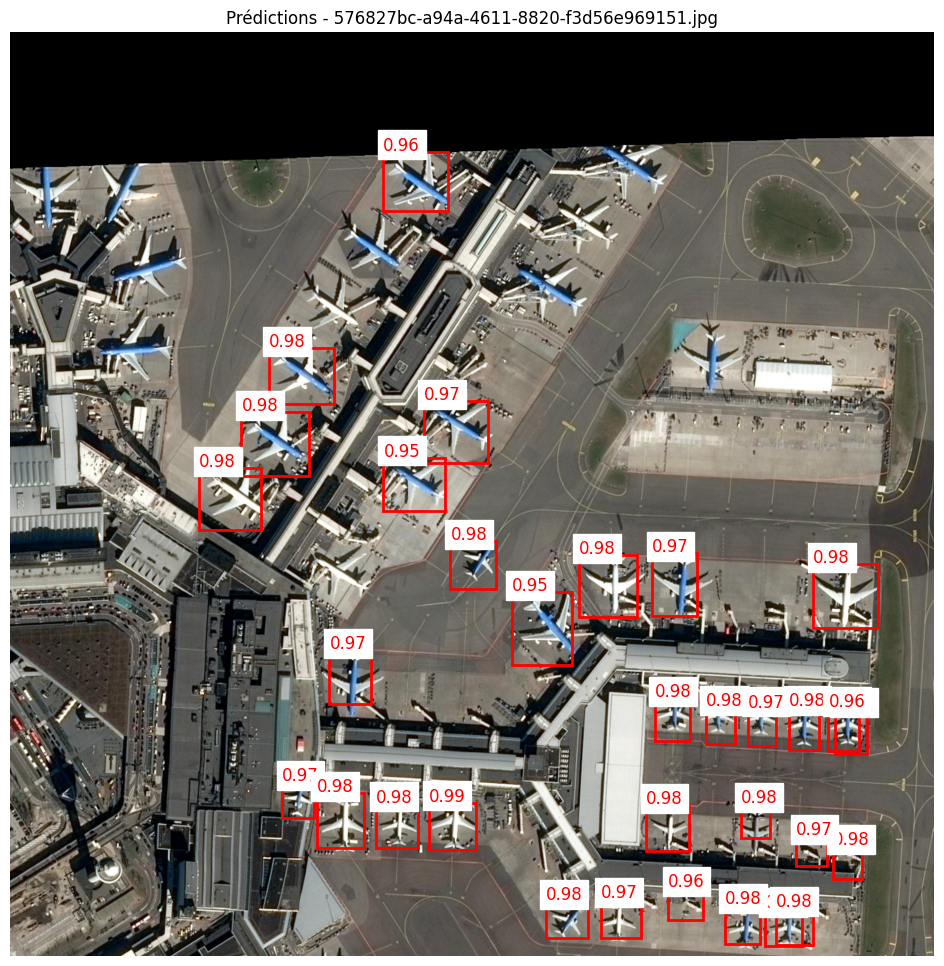

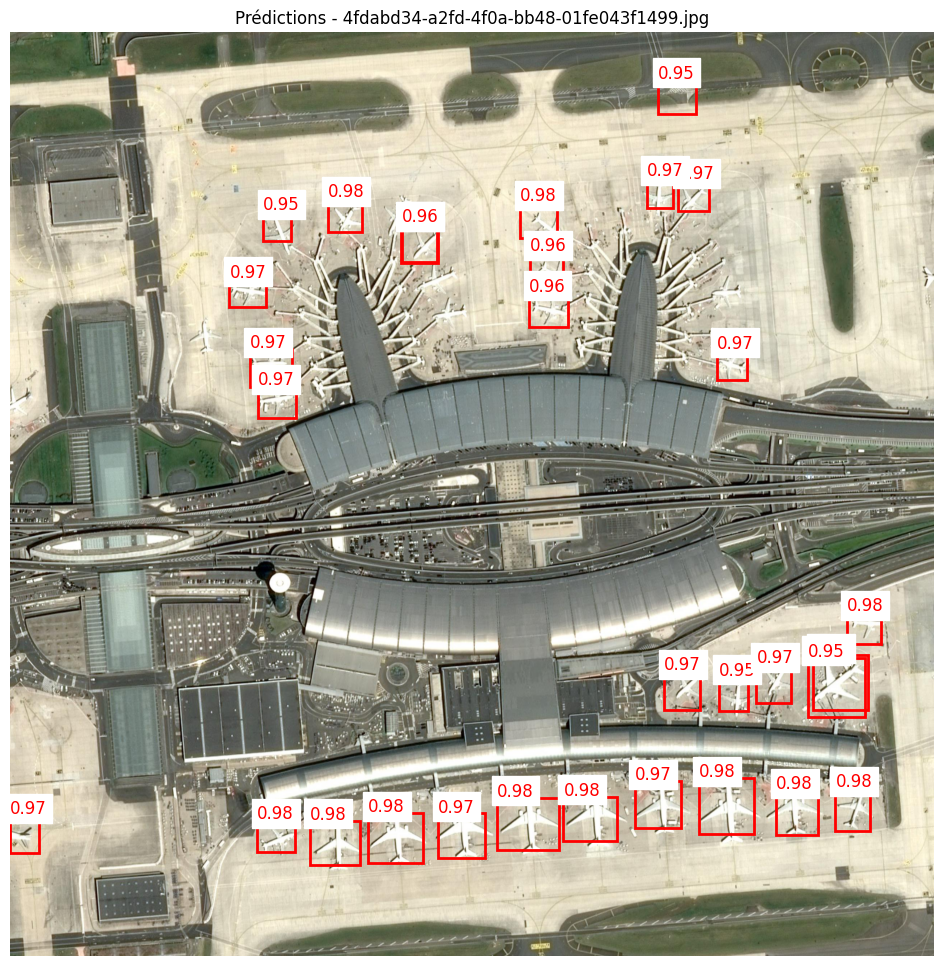

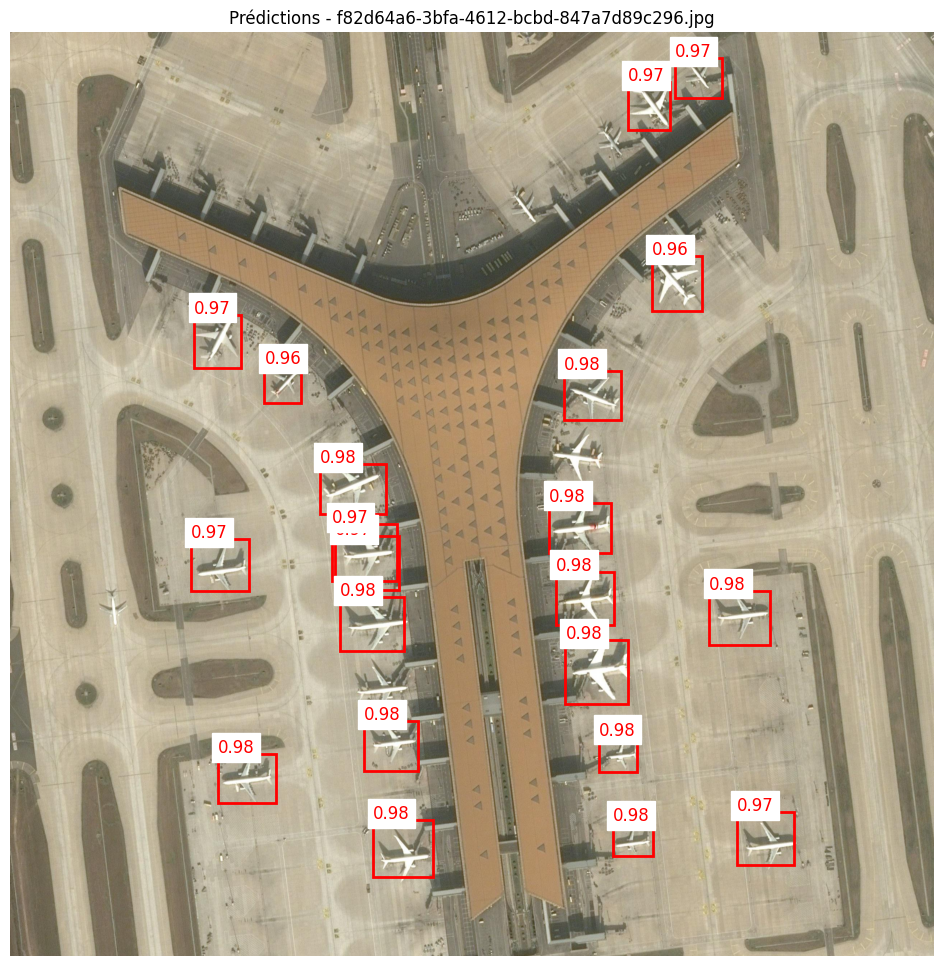

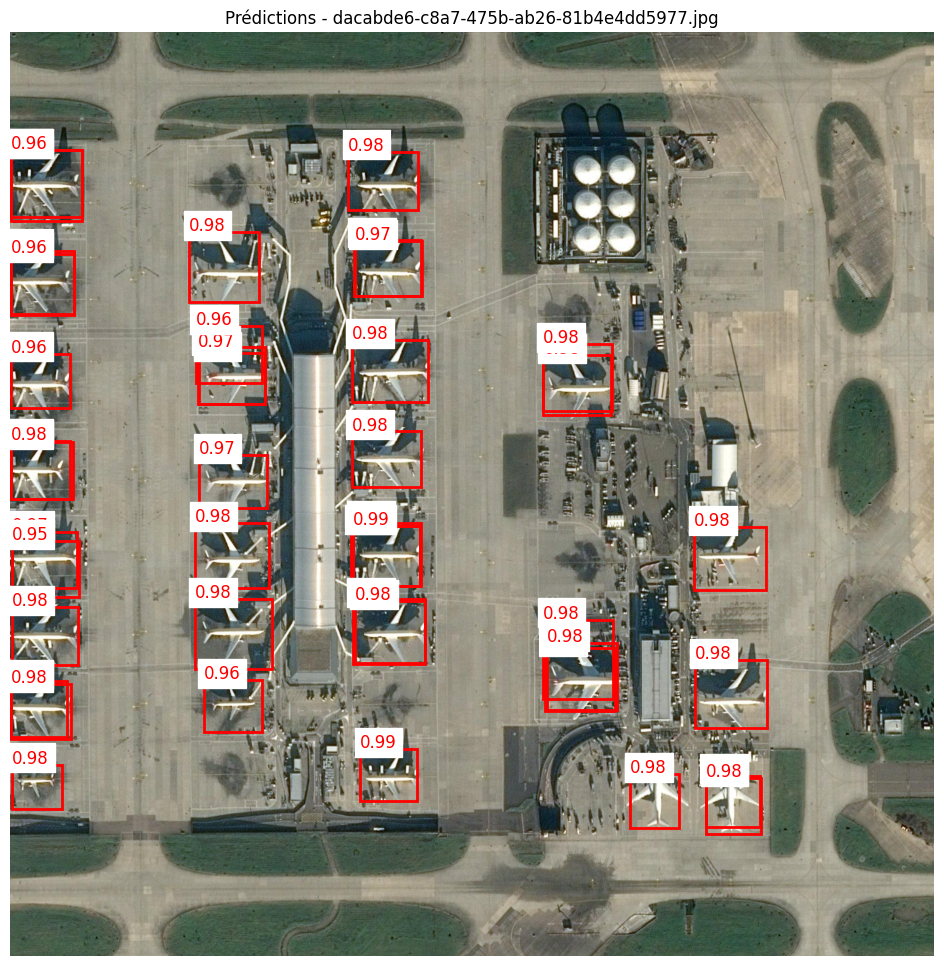

In [3]:
# 🔁 Monter Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 📦 Imports
import os
import json
import torch
import torchvision.transforms as T
from PIL import Image
from transformers import DetrForObjectDetection, DetrImageProcessor
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# 📁 Chemins
model_path = "/content/drive/MyDrive/detr_pleiades"
images_path = "/content/drive/MyDrive/Predicted_Images/"
output_json_path = "/content/drive/MyDrive/JSONS_DETR_Optique/"

# 🔧 Charger le modèle et le processor
model = DetrForObjectDetection.from_pretrained(model_path, id2label={0: "Airplane"})
processor = DetrImageProcessor.from_pretrained(model_path)
model.eval().cuda()

# ✅ Créer le dossier de sortie s’il n’existe pas
os.makedirs(output_json_path, exist_ok=True)

# 🔄 Boucle sur les images
for img_name in os.listdir(images_path):
    if not img_name.lower().endswith(('.jpg', '.jpeg', '.png', '.tif')):
        continue

    img_path = os.path.join(images_path, img_name)
    image = Image.open(img_path).convert("RGB")
    w, h = image.size

    # 🔍 Prétraitement
    inputs = processor(images=image, return_tensors="pt").to("cuda")
    outputs = model(**inputs)

    # 📊 Extraction des prédictions
    probs = outputs.logits.softmax(-1)[0, :, :-1]
    keep = probs.max(-1).values > 0.95  # Seuil de confiance ici
    boxes = outputs.pred_boxes[0, keep].cpu().detach().numpy()
    scores = probs[keep].max(-1).values.cpu().detach().numpy()

    # 📦 Conversion et sauvegarde JSON
    coco_boxes = []
    for box, score in zip(boxes, scores):
        cx, cy, bw, bh = box
        x = (cx - bw / 2) * w
        y = (cy - bh / 2) * h
        coco_box = [x, y, bw * w, bh * h]
        coco_boxes.append({
            "image_id": img_name,
            "category_id": 1,
            "bbox": [round(float(v), 2) for v in coco_box],
            "score": round(float(score), 3)
        })

    out_file = os.path.join(output_json_path, os.path.splitext(img_name)[0] + ".json")
    with open(out_file, "w") as f:
        json.dump(coco_boxes, f, indent=2)

    # 🖼 Affichage avec matplotlib
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(image)
    for ann in coco_boxes:
        x, y, bw, bh = ann["bbox"]
        score = ann["score"]

        # Dessiner la boîte
        rect = patches.Rectangle((x, y), bw, bh, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Ajouter le score
        ax.text(x, y - 5, f"{score:.2f}", color='red', fontsize=12, backgroundcolor="white")

    ax.set_title(f"Prédictions - {img_name}")
    ax.axis('off')
    plt.show()

For SSDD:

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


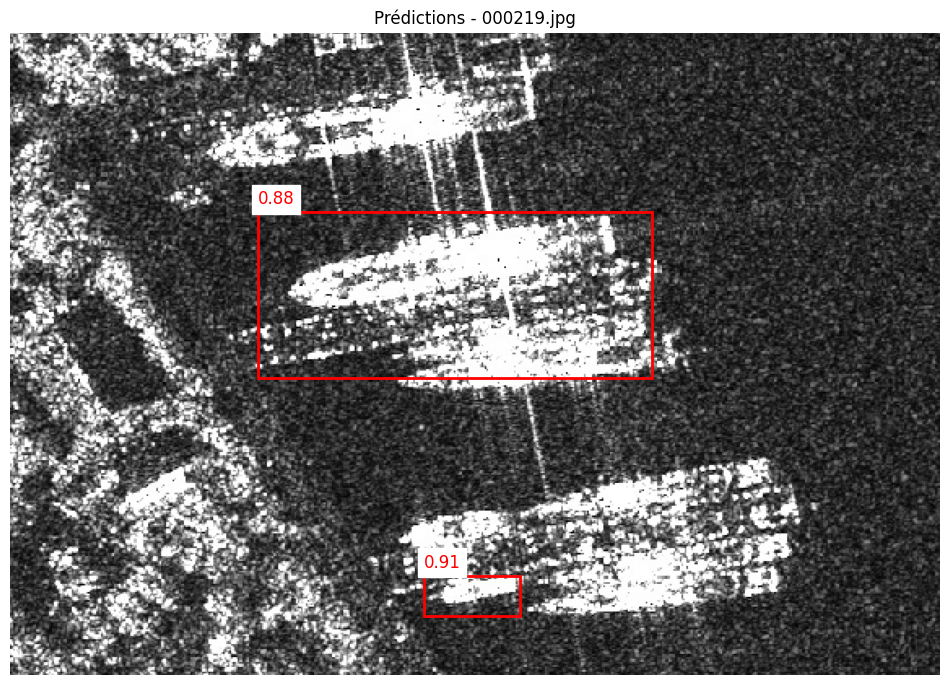

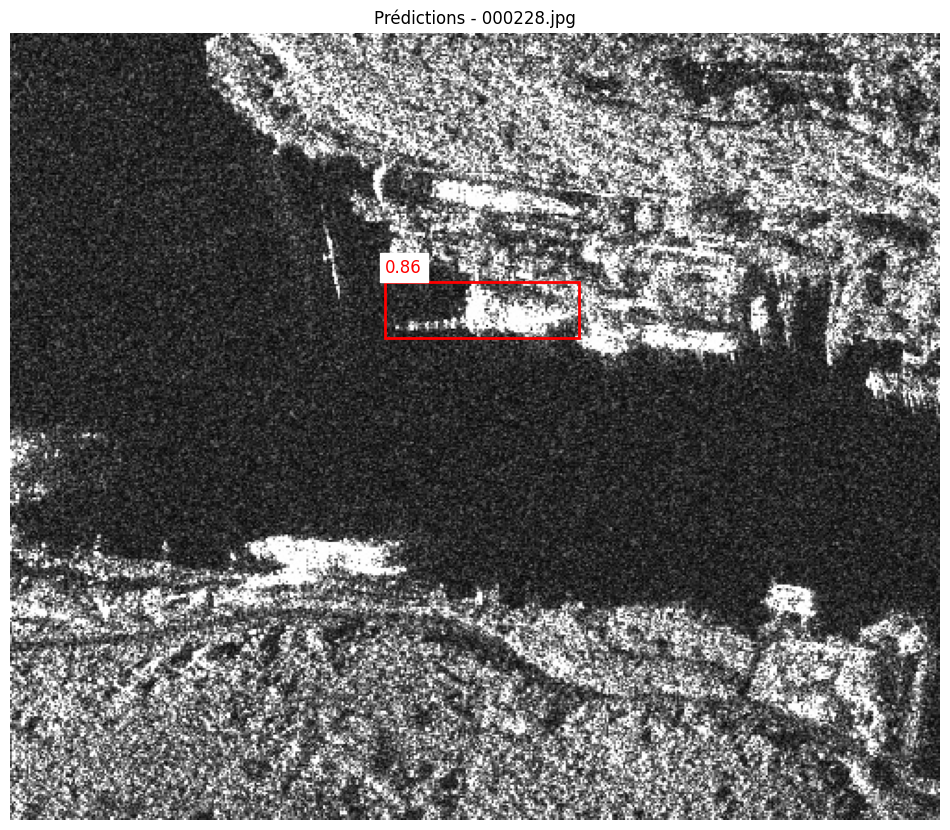

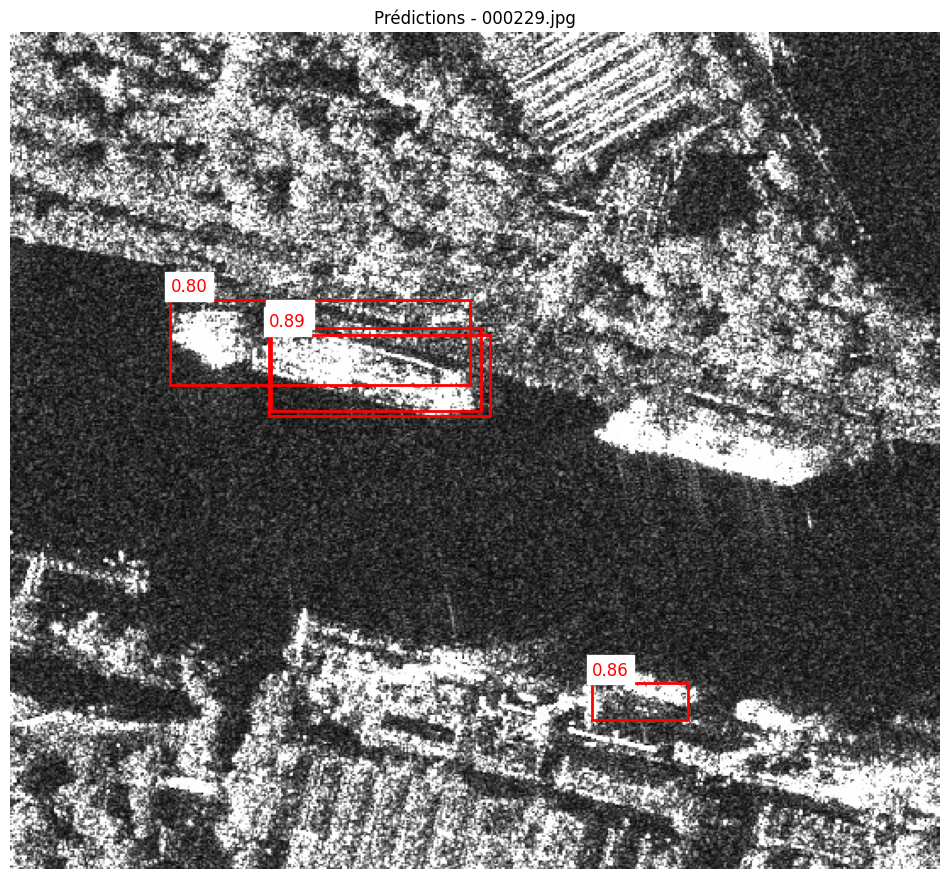

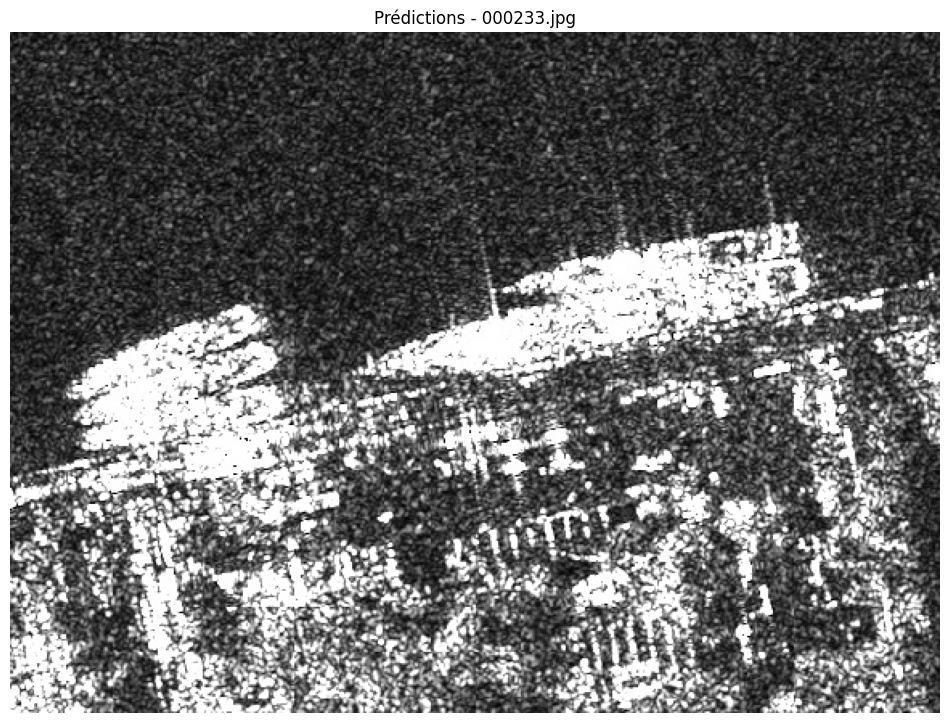

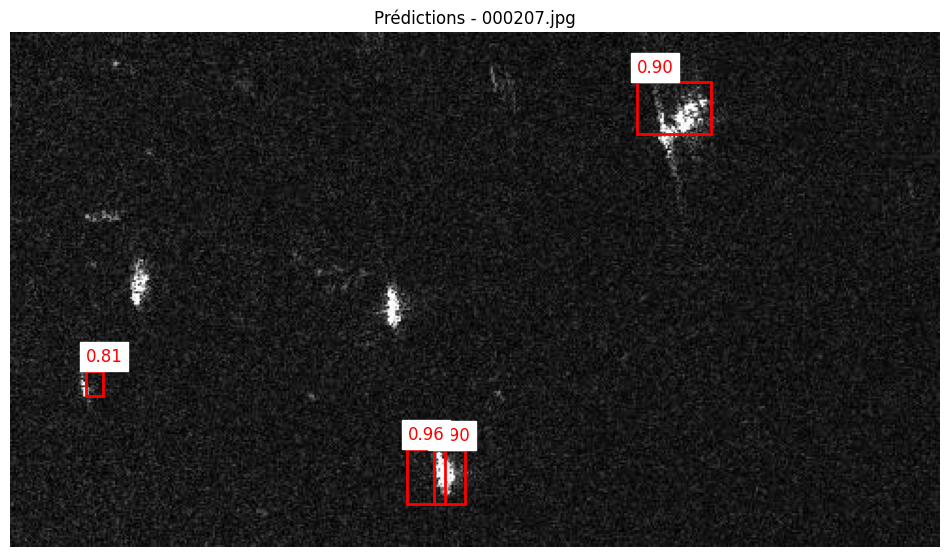

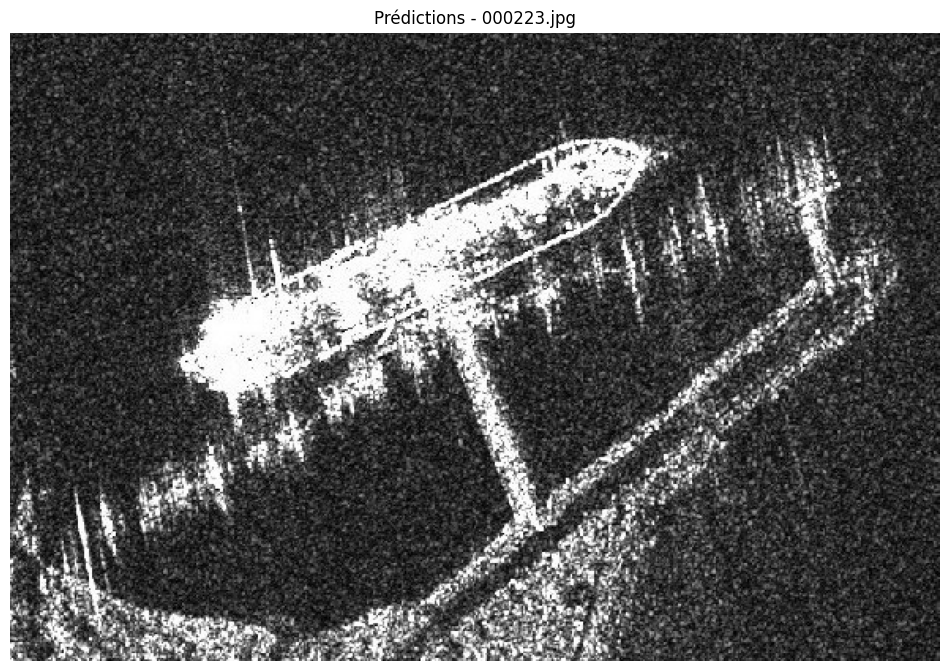

In [4]:
# 🔁 Monter Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 📦 Imports
import os
import json
import torch
import torchvision.transforms as T
from PIL import Image
from transformers import DetrForObjectDetection, DetrImageProcessor
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# 📁 Chemins
model_path = "/content/drive/MyDrive/detr_SSDD"
images_path = "/content/drive/MyDrive/Predicted_SAR_Images/"
output_json_path = "/content/drive/MyDrive/JSONS_DETR_SSDD/"

# 🔧 Charger le modèle et le processor
model = DetrForObjectDetection.from_pretrained(model_path, id2label={0: "Ship"})
processor = DetrImageProcessor.from_pretrained(model_path)
model.eval().cuda()

# ✅ Créer le dossier de sortie s’il n’existe pas
os.makedirs(output_json_path, exist_ok=True)

# 🔄 Boucle sur les images
for img_name in os.listdir(images_path):
    if not img_name.lower().endswith(('.jpg', '.jpeg', '.png', '.tif')):
        continue

    img_path = os.path.join(images_path, img_name)
    image = Image.open(img_path).convert("RGB")
    w, h = image.size

    # 🔍 Prétraitement
    inputs = processor(images=image, return_tensors="pt").to("cuda")
    outputs = model(**inputs)

    # 📊 Extraction des prédictions
    probs = outputs.logits.softmax(-1)[0, :, :-1]
    keep = probs.max(-1).values > 0.9  # Seuil de confiance ici
    boxes = outputs.pred_boxes[0, keep].cpu().detach().numpy()
    scores = probs[keep].max(-1).values.cpu().detach().numpy()

    # 📦 Conversion et sauvegarde JSON
    coco_boxes = []
    for box, score in zip(boxes, scores):
        cx, cy, bw, bh = box
        x = (cx - bw / 2) * w
        y = (cy - bh / 2) * h
        coco_box = [x, y, bw * w, bh * h]
        coco_boxes.append({
            "image_id": img_name,
            "category_id": 1,
            "bbox": [round(float(v), 2) for v in coco_box],
            "score": round(float(score), 3)
        })

    out_file = os.path.join(output_json_path, os.path.splitext(img_name)[0] + ".json")
    with open(out_file, "w") as f:
        json.dump(coco_boxes, f, indent=2)

    # 🖼 Affichage avec matplotlib
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(image)
    for ann in coco_boxes:
        x, y, bw, bh = ann["bbox"]
        score = ann["score"]

        # Dessiner la boîte
        rect = patches.Rectangle((x, y), bw, bh, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Ajouter le score
        ax.text(x, y - 5, f"{score:.2f}", color='red', fontsize=12, backgroundcolor="white")

    ax.set_title(f"Prédictions - {img_name}")
    ax.axis('off')
    plt.show()